In [1]:
import matplotlib
#from tabulate import tabulate
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import re
from geopy.geocoders import Nominatim
import seaborn as sns
#from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
import folium
from folium.plugins import MarkerCluster

sns.set_theme(style="darkgrid")
pd.set_option('mode.chained_assignment', None)
pd.set_option('display.max_columns', None)

In [2]:
# Customize matplotlib
matplotlib.rcParams.update({
    'text.usetex': False,
    'font.family': 'serif',
    'font.serif': 'cmr10',
    'mathtext.fontset': 'cm',
    'axes.unicode_minus': False,
})

In [3]:
# Due to mixed values, we will be treating most fields as text for now and see if there
# is anything to be done such that numerical values could be extracted out of these.
# There are however a few Boolean and Numerical types exceptions.

df = pd.read_csv(r"C:\Users\Acer\Documents\data madness\met_collection_cleaning\MetObjects.csv", dtype={
    'Gallery Number': str, 'Period': str,
    'Portfolio': str,
    'Dimensions': str

}, low_memory=False)
#, nrows=20000


#df = pd.read_csv(r"C:\Users\Tudor\PycharmProjects\Intelligent\MetObjects.txt", dtype={
#    'Gallery Number': str, 'Period': str,
#    'Portfolio': str,
#    'Dimensions': str
#
#}, low_memory=False, nrows=20000)

In [4]:
# We are only interested in the paintings and drawings
df = df.loc[df['Classification'].isin(['Paintings', 'Drawings'])]

# Re-order the columns such that <Object ID> is the first column.
# Other reorders should follow
df = df[
    ['Object ID', 'Department', 'AccessionYear', 'Object Name', 'Title', 'Culture',
     'Reign', 'Artist Display Name', 'Artist Nationality', 'Artist Begin Date', 'Artist End Date',
     'Artist Wikidata URL',
     'Object Begin Date', 'Object End Date', 'Medium', 'Dimensions',
     'City', 'Country', 'Classification', 'Object Wikidata URL', 'Tags']]

In [44]:
# Number of rows that have a value NaN
for column in df:
    print(column, len(df[pd.isnull(df[column])]), "/", len(df['Object ID']))

# In case we can fill the NaN values with 0
# df1 = df.copy()
# Fill all NaN values with 0

Object ID 0 / 36339
Department 0 / 36339
AccessionYear 39 / 36339
Object Name 35 / 36339
Title 2214 / 36339
Culture 26940 / 36339
Reign 36339 / 36339
Artist Display Name 1275 / 36339
Artist Nationality 5853 / 36339
Artist Begin Date 4884 / 36339
Artist End Date 4870 / 36339
Artist Wikidata URL 8734 / 36339
Object Begin Date 0 / 36339
Object End Date 0 / 36339
Medium 301 / 36339
Dimensions 710 / 36339
City 36247 / 36339
Country 35656 / 36339
Classification 0 / 36339
Object Wikidata URL 25657 / 36339
Tags 7004 / 36339


In [5]:
# Displaying all values of the dataframe if necessary
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Displaying all unique values in every column
# for col in df:
# print(col, df[col].unique())

In [6]:
# Clean up of the Culture column
df['Culture'] = df['Culture'].str.replace('for export', '')
df['Culture'] = df['Culture'].str.replace(', for Swedish market', ' (Swedish market)')
df['Culture'] = df['Culture'].str.replace(', for American market', ' (American market)')
df['Culture'] = df['Culture'].str.replace('or', ',')
df['Culture'] = df['Culture'].str.replace(', probably', '')
df['Culture'] = df['Culture'].str.replace(', possibly', '')
df['Culture'] = df['Culture'].str.replace('probably', '')

In [7]:
df.loc[:, 'Covered Area'] = -1
# print(tabulate(df, headers = 'keys', tablefmt = 'psql'))
# print(df.dtypes)

In [8]:
# select the items whose id and dimensions are not NaN
df = df[df['Object ID'].notna()]
df = df[df['Dimensions'].notna()]

In [9]:
# Several fields support multiple values, they should look similarly to the values
# at the <Tags> field in order to reduce the confusion.
df['Medium'] = df['Medium'].str.lower()
df['Medium'] = (df['Medium'].str.replace(", ", "|"))
df['Artist Nationality'] = (df['Artist Nationality'].str.replace(", ", "|"))

In [10]:
# Originally, the dimensions of each object are stored both in inches and centimeters
# Should only keep the centimeters dimensions
# i.e. 15 3/4 x 11 3/4 in. (40 x 29.8 cm) - > 40 x 29.8
# keeping in mind that the resulting column will denote the dimensions in cm
df['Dimensions'] = df['Dimensions'].apply(lambda st: st[st.find("(") + 1:st.find(")")])
df['Dimensions'] = (df['Dimensions'].str.replace("cm", ""))
df['Dimensions'] = (df['Dimensions'].str.replace(" ", ""))
df['Dimensions'] = (df['Dimensions'].str.replace("×", "x"))

In [11]:
# For now, it might not be the best idea to turn the <Dimensions> column into numerical types
# since there is a mixture of 2-dimensional and 3-dimensional items (e.g. 1 x 5.3 VS 2 x 4 x 8)
df['Dimensionality'] = df['Dimensions'].apply(lambda st: str.count(st, "x") + 1)

In [12]:
for index, (dimensionality, dimensions) in enumerate(zip(df['Dimensionality'], df['Dimensions'])):
    if (df.iloc[index]['Dimensionality']) == 1:
        df.at[index, 'Dimensionality'] = 2
        df.at[index, 'Dimensions'] = df.iloc[index]['Dimensions'] + "x" + df.iloc[index]['Dimensions']

In [13]:
# We can see that some of the items do not have a specified dimension, would rather delete
# those items since there's not much we can do with badly catalogued items like these.
df = df[~df['Dimensions'].str.contains("unavailabl", na=False)]
# besides unaivalable, there are: irregular, trimmed, bookletclosed, necklace, includingfur, eachscroll,
# Left, withbase, N.A, Eachapprox., each, bottomsection, variabl, topsection, trimmedtoplate, 
# also in these forms: 511/16in., SealFace;1.12x0.74\r\nHeight:0.56\r\nStringHole..., [nodimensionsavailable

In [14]:
# below we look for each object's dimensions, and if it doesn't contain a digit, we remove the row
# re.search(r'\d', inputString)
for index, dimensions in enumerate(df['Dimensions']):
    string = df.iloc[index]['Dimensions']
    nr_d = 0
    for c in string:
        if c.isdigit():
            nr_d += 1
    if (nr_d == 0): # if the dimensions contain no digit
        df.at[index, 'Dimensions'] = 'DELETE' # mark the item

df = df[~df['Dimensions'].str.contains("DELETE", na=False)] # delete the marked items

In [15]:
# convert columns to numeric values
df['AccessionYear'] = df['AccessionYear'].astype('float')
df['AccessionYear'] = df['AccessionYear'].astype('Int32')

df['Object ID'] = df['Object ID'].astype('Int64')
df['Dimensionality'] = df['Dimensionality'].fillna(0).astype('Int32')

df['Object Begin Date'] = pd.to_numeric(df['Object Begin Date'], errors='coerce')
df['Object End Date'] = pd.to_numeric(df['Object End Date'], errors='coerce')

df['Artist Begin Date'] = pd.to_numeric(df['Artist Begin Date'], errors='coerce')
df['Artist End Date'] = pd.to_numeric(df['Artist End Date'], errors='coerce')

In [16]:
# count the total covered area of each item
for index_item, item in df.iterrows():

    if (df['Dimensionality'][index_item] == 2):
        number_dimensions = []
        text_dimension = df['Dimensions'][index_item]
        number_dimensions = [float(s) for s in re.findall(r'-?\d+\.?\d*', text_dimension)]

        covered_area = np.prod(np.array(number_dimensions))
        df['Covered Area'][index_item] = covered_area

In [17]:
# Unfortunately, there are a couple dimensions that couldn't have been extracted
# given a really bad input when the item was introduced into the DB by the employees
# Since part of our analysis needs the area covered by each painting/drawing, we will only keep
# the ones with a good input
df = df[df['Dimensionality'] == 2]

In [18]:
# Clean up of the Country column
# USA -> United States
# US -> United States
# The United States -> United States
df['Country'] = df['Country'].str.replace('USA', 'United States')
df['Country'] = df['Country'].str.replace('US', 'United States')
df['Country'] = df['Country'].str.replace('The United States', 'United States')

In [22]:
# remove items that have begin or end date 0
df = df[df['Object Begin Date'] > 0]
df = df[df['Object End Date'] > 0]

# calculate the total time of working on each item
df['years_worked_item'] = df['Object End Date'] - df['Object Begin Date']
df['years_worked_item'] = pd.to_numeric(df['years_worked_item'], errors='coerce')

# calculate how long each artis lived
df['years_lived_artist'] = df['Artist End Date'] - df['Artist Begin Date']
df['years_lived_artist'] = pd.to_numeric(df['years_lived_artist'], errors='coerce')

In [23]:
# There are a couple outliers that have to be ignored throughout the plotting
# Definitely badly inserted data.
# Otherwise, a few 6000 values would show up
df = df[df['years_lived_artist'] < 120]

# Assuming we are not interesting in the extremely tiny ones
df = df[df['Covered Area'] > 10]

# There's only 1 extreme outlier that we'd like to remove
df = df[df['Covered Area'] < 200000]

In [ ]:
df

C:\Users\Acer\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


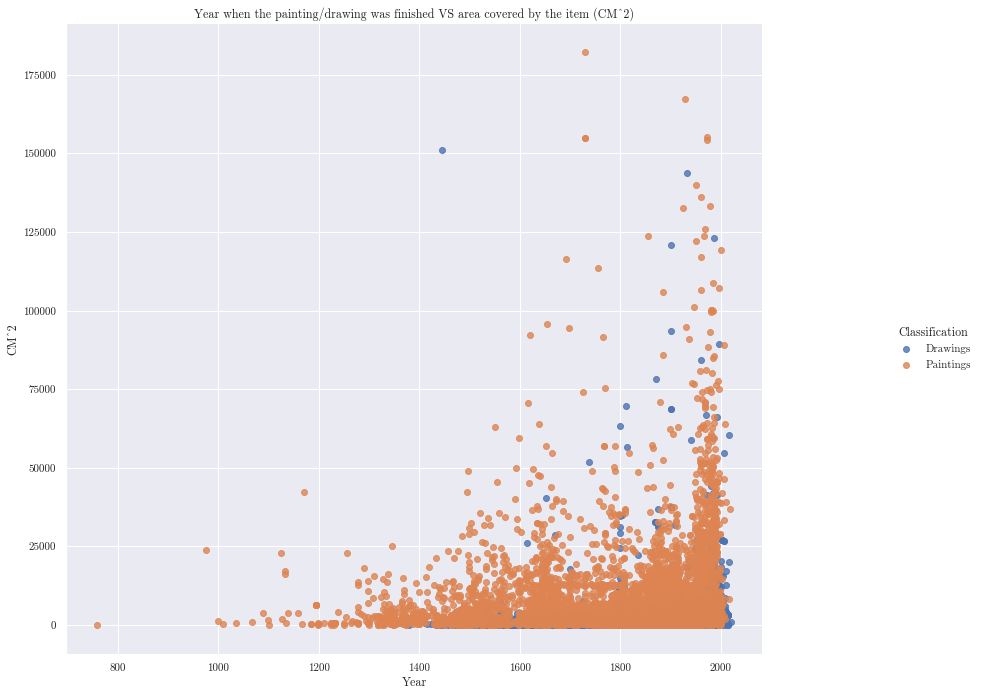

In [86]:
sns.lmplot('Object End Date', 'Covered Area', df, hue='Classification', fit_reg=False)
plt.title("Year when the painting/drawing was finished VS area covered by the item (CM^2)")
plt.xlabel("Year")
plt.ylabel("CM^2")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

C:\Users\Acer\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


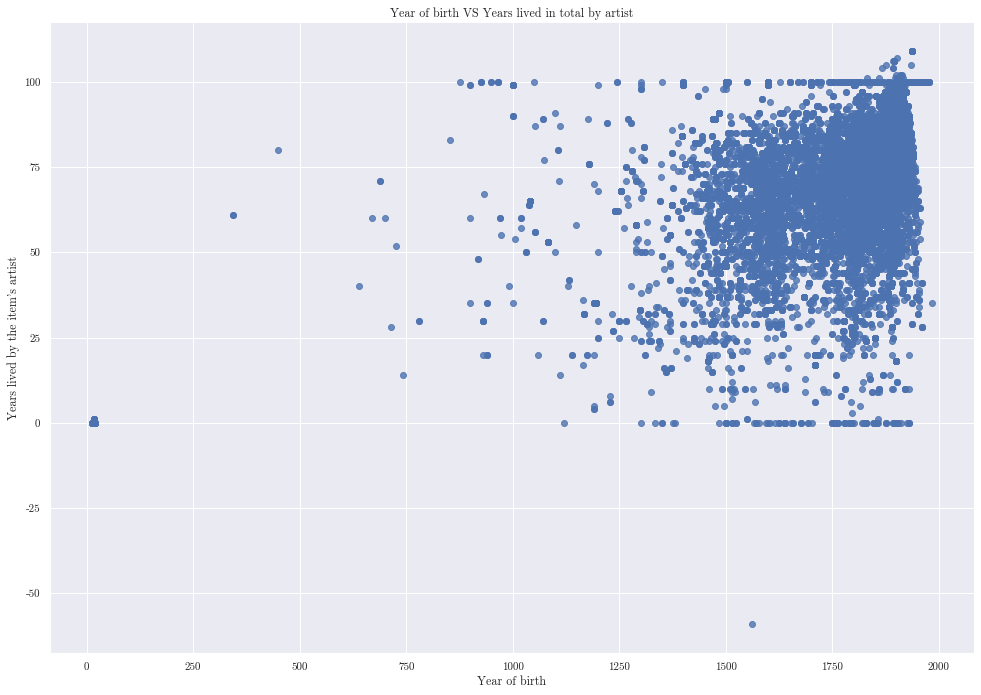

In [87]:
sns.lmplot('Artist Begin Date', 'years_lived_artist', df, fit_reg=False)
plt.title("Year of birth VS Years lived in total by artist")
plt.xlabel("Year of birth")
plt.ylabel("Years lived by the item's artist")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

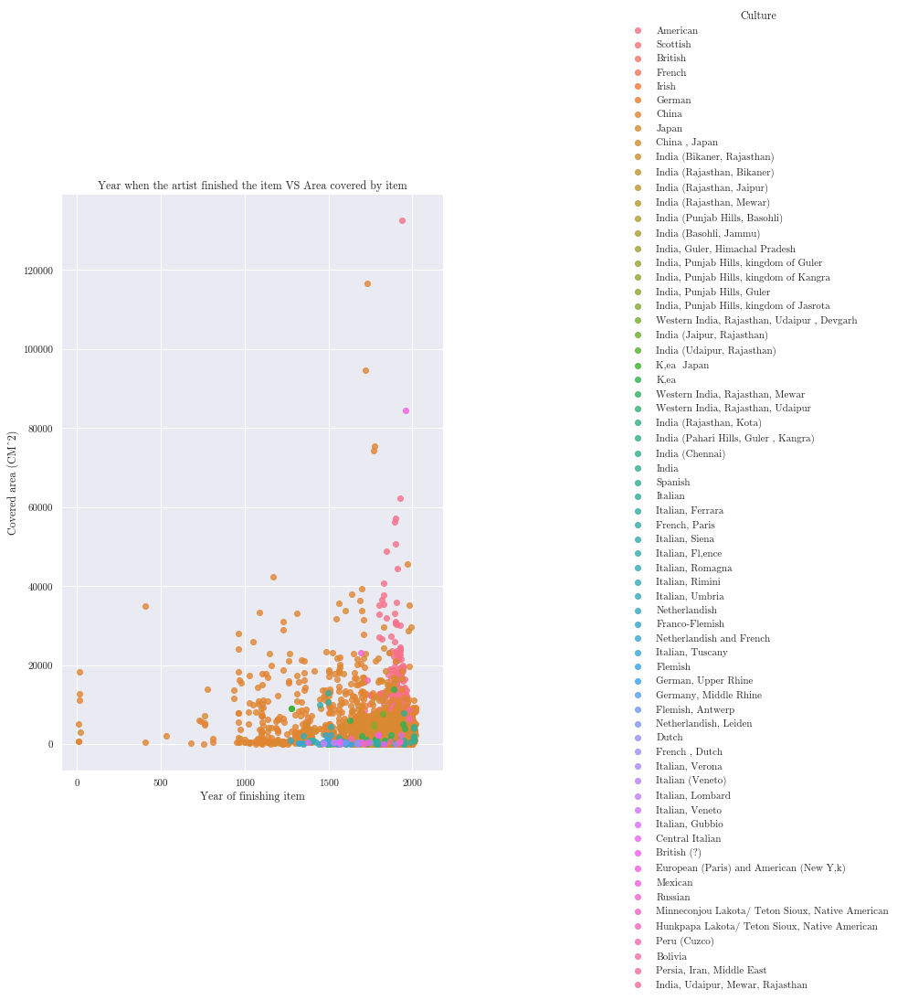

In [88]:
sns.lmplot('Artist End Date', 'Covered Area', df, hue='Culture', fit_reg=False)
plt.title("Year when the artist finished the item VS Area covered by item")
plt.xlabel("Year of finishing item")
plt.ylabel("Covered area (CM^2)")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

C:\Users\Acer\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


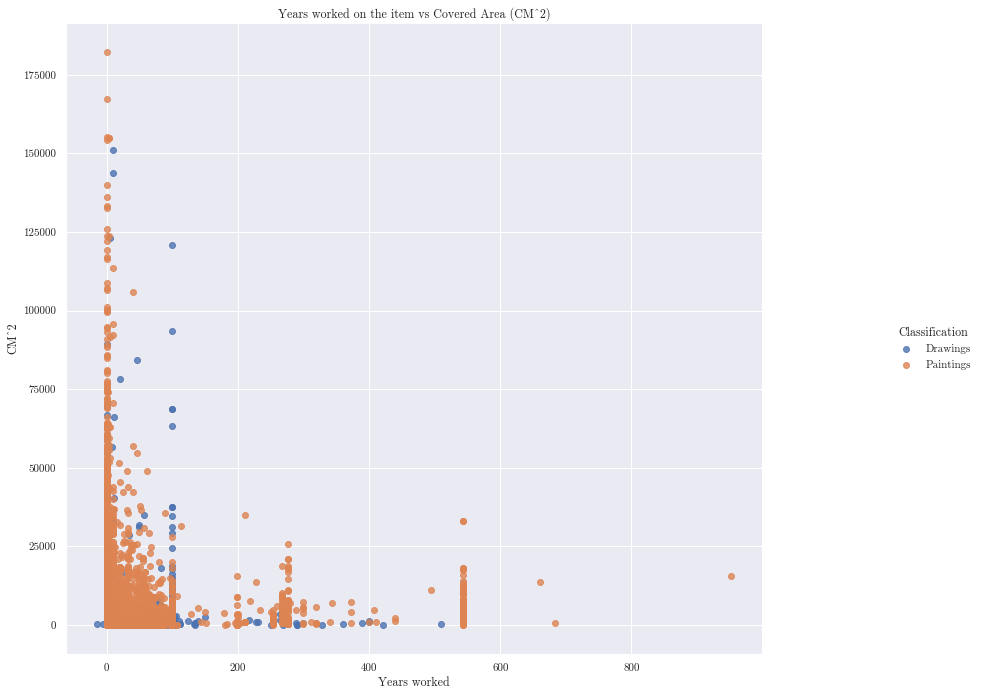

In [89]:
sns.lmplot('years_worked_item', 'Covered Area', df, hue='Classification', fit_reg=False)
plt.title("Years worked on the item vs Covered Area (CM^2)")
plt.xlabel("Years worked")
plt.ylabel("CM^2")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

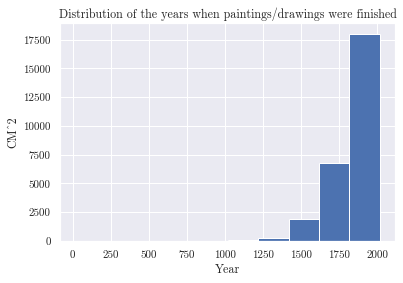

In [24]:
df["Object End Date"].plot(kind="hist")
plt.title("Distribution of the years when paintings/drawings were finished")
plt.xlabel("Year")
plt.ylabel("CM^2")
plt.show()

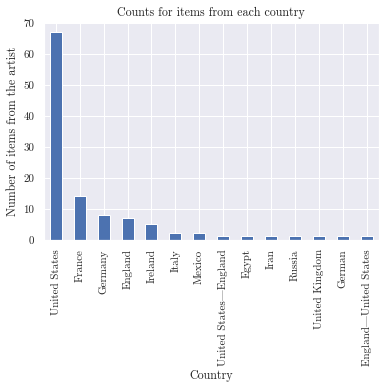

In [25]:
df['Country'].value_counts().plot(kind='bar')
plt.title("Counts for items from each country")
plt.xlabel("Country")
plt.ylabel("Number of items from the artist")
plt.show()

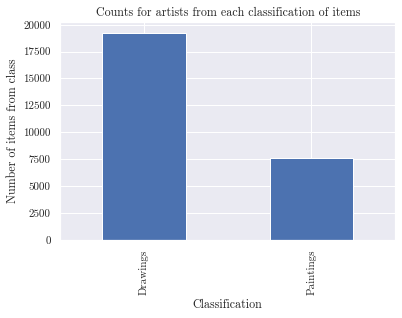

In [26]:
df['Classification'].value_counts().plot(kind='bar')
plt.title("Counts for artists from each classification of items")
plt.xlabel("Classification")
plt.ylabel("Number of items from class")
plt.show()

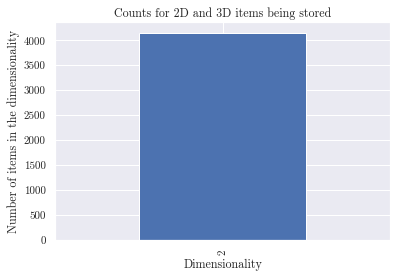

In [131]:
df['Dimensionality'].value_counts().plot(kind='bar')
plt.title("Counts for 2D and 3D items being stored")
plt.xlabel("Dimensionality")
plt.ylabel("Number of items in the dimensionality")
plt.show()

In [27]:
# We have to convert them back to int
df['Object Begin Date'] = df['Object Begin Date'].astype('Int32')
df['Object End Date'] = df['Object End Date'].astype('Int32')

df['Artist Begin Date'] = df['Artist Begin Date'].astype('Int32')
df['Artist End Date'] = df['Artist End Date'].astype('Int32')

# del df['years_lived_artist']
# del df['years_worked_item']

In [31]:
# let's now look only at paintings
dfp = df.loc[df['Classification'] == 'Paintings']
dfp

,Object ID,Department,AccessionYear,Object Name,Title,Culture,Reign,Artist Display Name,Artist Nationality,Artist Begin Date,Artist End Date,Artist Wikidata URL,Object Begin Date,Object End Date,Medium,Dimensions,City,Country,Classification,Object Wikidata URL,Tags,Covered Area,Dimensionality,years_worked_item,years_lived_artist
414,471,The American Wing,1883,Painting,Plaque Portrait of Benjamin Franklin,NaN,NaN,Jean-Baptiste Nini,Italian,1717,1786,https://www.wikidata.org/wiki/Q3164318,1776,1883,ivory,6.7x5.1,NaN,France,Paintings,https://www.wikidata.org/wiki/Q79024309,Benjamin Franklin|Men|Portraits,34.1700,2,107.0,69.0
428,485,The American Wing,1883,Painting,Portrait of Benjamin Franklin,NaN,NaN,H. Sanford,NaN,1783,1822,NaN,1776,1883,panel,13.7x10.8,NaN,France,Paintings,https://www.wikidata.org/wiki/Q79023347,Benjamin Franklin|Men|Portraits,147.9600,2,107.0,39.0
3674,3926,The American Wing,1883,Painting,Panel of George Washington,NaN,NaN,William P. Babcock,NaN,1826,1899,https://www.wikidata.org/wiki/Q18508740,1846,1883,panel,14x11.4,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q79022461,George Washington|Portraits|Men,159.6000,2,37.0,73.0
3715,3970,The American Wing,1883,Painting,Plaque of George Washington,NaN,NaN,Gilbert Stuart,American,1755,1828,https://www.wikidata.org/wiki/Q41402,1776,1830,painted glass,20.3x13.7,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q79022258,George Washington|Portraits|Men,278.1100,2,54.0,73.0
4857,5223,The American Wing,1996,Painting,Apple Blossoms,American,NaN,Charles Caryl Coleman,American,1840,1928,https://www.wikidata.org/wiki/Q5076135,1889,1889,oil on canvas,158.4x88.9,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q20169878,Flowers|Still Life,14081.7600,2,0.0,88.0
7022,7499,The American Wing,1996,Painting,Janet Halleck Drake,American,NaN,Henry Inman,American,1801,1846,https://www.wikidata.org/wiki/Q3132855,1825,1825,oil on canvas,75.6x62.9,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q20174119,Girls|Portraits,4755.2400,2,0.0,45.0
9306,10028,The American Wing,1966,Painting,Orange Branch,American,NaN,John La Farge,American,1835,1910,https://www.wikidata.org/wiki/Q3120087,1880,1883,oil on canvas,138.4x29.5,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q19924754,Fruit|Leaves,4082.8000,2,3.0,75.0
9313,10035,The American Wing,1967,Painting,Pasture at Evening,American,NaN,Albert Pinkham Ryder,American,1847,1917,https://www.wikidata.org/wiki/Q948598,1913,1931,oil on canvas,30.5x40.6,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q19924060,Animals|Pastoral|Trees|Evening,1238.3000,2,18.0,70.0
9321,10049,The American Wing,1913,Painting,"""King Lear,"" Act I, Scene I",American,NaN,Edwin Austin Abbey,American,1852,1911,https://www.wikidata.org/wiki/Q259538,1898,1898,oil on canvas,137.8x323.2,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q19925330,Shakespeare|Kings|Men|Women|Dogs,44536.9600,2,0.0,59.0
9329,10061,The American Wing,1972,Painting,"Leete Farm, West Claremont, New Hampshire",American,NaN,Francis Alexander,NaN,1800,1880,https://www.wikidata.org/wiki/Q5479973,1819,1822,oil on canvas,20.2x20.2,NaN,NaN,Paintings,https://www.wikidata.org/wiki/Q19925477,Houses|Farms|Men|Cows|Hills,408.0400,2,3.0,80.0


In [76]:
# create a new data frame where we keep unique artists
dffff = dfp.groupby('Artist Display Name', as_index=False).agg(
    count=('Object ID', 'count'), # count the number of items they have in the museum
    total_covered=('Covered Area', sum), # sum their total covered area in the museum
    nationality=('Artist Nationality', lambda x: x.iloc[0]) # add their nationality
) # total_worked=('years_worked_item', sum)

# compute average covered area
dffff['Average Covered Area'] = dffff.apply(lambda x: x['total_covered'] / x['count'], axis=1)
#dffff['Years Worked Average'] = dffff.apply(lambda x: x['total_worked'] / x['count'], axis=1)

# keep only the artists with at least 2 paintings at Met
dffff = dffff[dffff['count'] > 1]
# sort the values to see the artists with most total covered area
dffff.sort_values('total_covered', ascending=False, inplace=True)

In [77]:
dffff

,Artist Display Name,count,total_covered,nationality,Average Covered Area
951,Giovanni Battista Tiepolo,20,730376.0400,Italian,36518.802000
144,Andy Warhol,30,574089.0200,American,19136.300667
480,Clyfford Still,12,552549.6300,American,46045.802500
2960,Xie Zhiliu,232,537132.7700,Chinese,2315.227457
1988,Morris Louis,4,351798.3600,American,87949.590000
1037,Hans Hofmann,14,346794.7900,American|born Germany,24771.056429
64,Alex Katz,9,340117.2800,American,37790.808889
1443,John Singer Sargent,40,330617.7800,American,8265.444500
1604,Kenneth Noland,4,318389.6300,American,79597.407500
1253,James Rosenquist,4,313673.1100,American,78418.277500


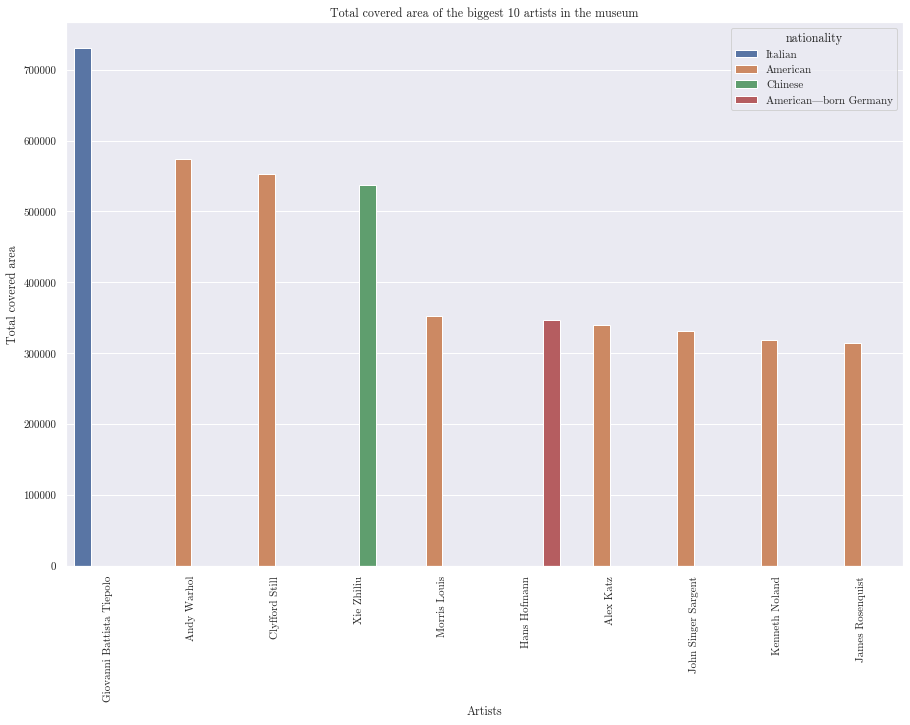

In [79]:
z=dffff.iloc[:10,:] # use the first 10 for the barplot
p=sns.barplot(x='Artist Display Name', y='total_covered', hue='nationality', data=z)
for item in p.get_xticklabels():
    item.set_rotation(90)
plt.title("Total covered area of the biggest 10 artists in the museum")
plt.xlabel("Artists")
plt.ylabel("Total covered area")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

In [88]:
# create another dataframe where keeping each year and its statistics
df_years = dfp.groupby('Artist End Date', as_index=False).agg(
    count=('Object ID', 'count'), # how many objects were created that year
    total_covered=('Covered Area', sum)) # total covered area of the objects created that year
df_years['Average Covered Area'] = df_years.apply(lambda x: x['total_covered'] / x['count'], axis=1)

#df_years['Years'] = df_years.index
df_years.sort_values('total_covered', ascending=False, inplace=True)
df_years

,Artist End Date,count,total_covered,Average Covered Area
409,1770,40,1.021951e+06,25548.772000
633,1997,263,9.328369e+05,3546.908289
646,2010,27,8.749095e+05,32404.054815
616,1980,32,8.152826e+05,25477.580938
623,1987,53,7.490442e+05,14132.908868
561,1925,71,6.295306e+05,8866.628873
598,1962,39,6.014588e+05,15422.021538
611,1975,61,5.909177e+05,9687.175574
668,2037,11,5.663234e+05,51483.945455
643,2007,23,5.529215e+05,24040.063913


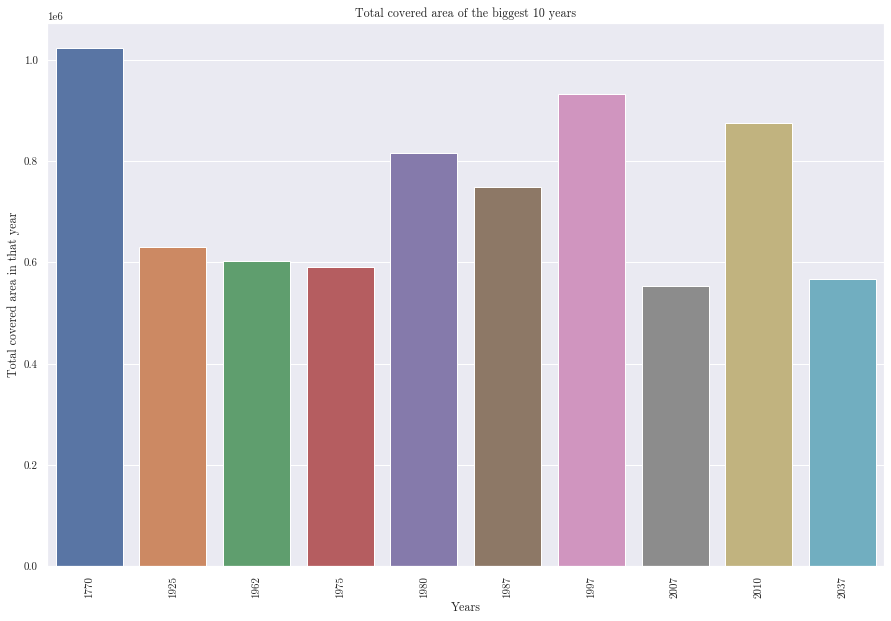

In [89]:
y=df_years.iloc[:10,:] # use the first 10 for the barplot
p=sns.barplot(x='Artist End Date', y='total_covered', data=y)
for item in p.get_xticklabels():
    item.set_rotation(90)
plt.title("Total covered area of the biggest 10 years")
plt.xlabel("Years")
plt.ylabel("Total covered area in that year")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

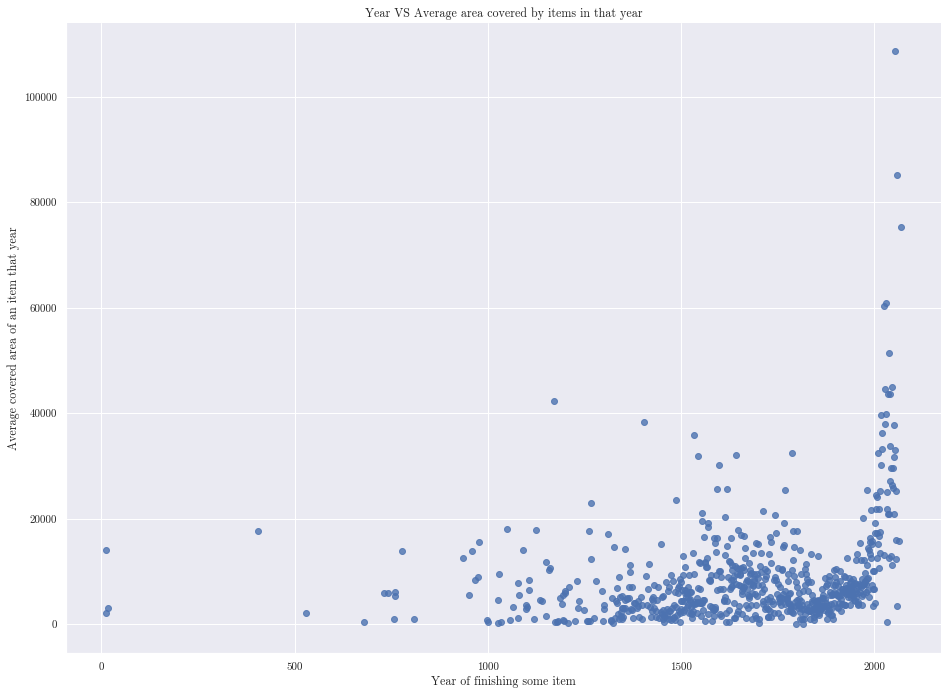

In [91]:
sns.lmplot('Artist End Date', 'Average Covered Area', df_years, fit_reg=False)
plt.title("Year VS Average area covered by items in that year")
plt.xlabel("Year of finishing some item")
plt.ylabel("Average covered area of an item that year")
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

In [135]:
# create a new dataframe for all unique artists
# df_new = df[['Artist Display Name']]

# unique_names = df_new['Artist Display Name'].unique()
# unique_names = pd.DataFrame(unique_names)
# unique_names['Count'] = 0
# unique_names['Total Covered Area'] = 0
# unique_names['Average Covered Area'] = 0

# unique_names['Years Worked Average'] = 0
# unique_names['Years Worked Total'] = 0

# unique_names.rename(columns={0: 'Name'}, inplace=True)

# unique_names['Works IDs'] = ''

In [149]:
# for index_item, item in df.iterrows():
#     for index_artist, artist in unique_names.iterrows():

#         if df['Artist Display Name'][index_item] == unique_names['Name'][index_artist]:
#             unique_names['Count'][index_artist] += 1
#             unique_names['Total Covered Area'][index_artist] += df['Covered Area'][index_item]
#             unique_names['Years Worked Total'][index_artist] += df['years_worked_item'][index_item]
#             # unique_names['Works IDs'] += (df['Object ID'][index_item] + '|')

#             # unique_names['Works'] = unique_names['Works'].apply(lambda x: x + [df['Object ID'][index_item]])


In [150]:
#unique_names['Average Covered Area'] = unique_names.apply(lambda x: x['Total Covered Area'] / x['Count'], axis=1)
#unique_names['Years Worked Average'] = unique_names.apply(lambda x: x['Years Worked Total'] / x['Count'], axis=1)

# keep only the artists with at least 2 paintings at Met
#unique_names = unique_names[unique_names['Count'] > 1]


# print(unique_names)
# print("----------------------------------------------------")
# print(df.head(10))